# Regresión lineal multivariable

### Importar librerias

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import *
import seaborn as sns
sns.set_theme(
    style='whitegrid',
    context='notebook',
    palette='Set2',
    font_scale=0.8
)

# Permite hacer un escalamiento de los datos, para que el modelo se ajuste mejor a ellos
# Minimizando los errores cuando hay valores atipicos o valores que estan muy por fuera del rango que se espera
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

## Regresión lineal multivariable

In [2]:
df = pd.read_csv('../data/housing.data', header=None, sep='\s+')
df.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2


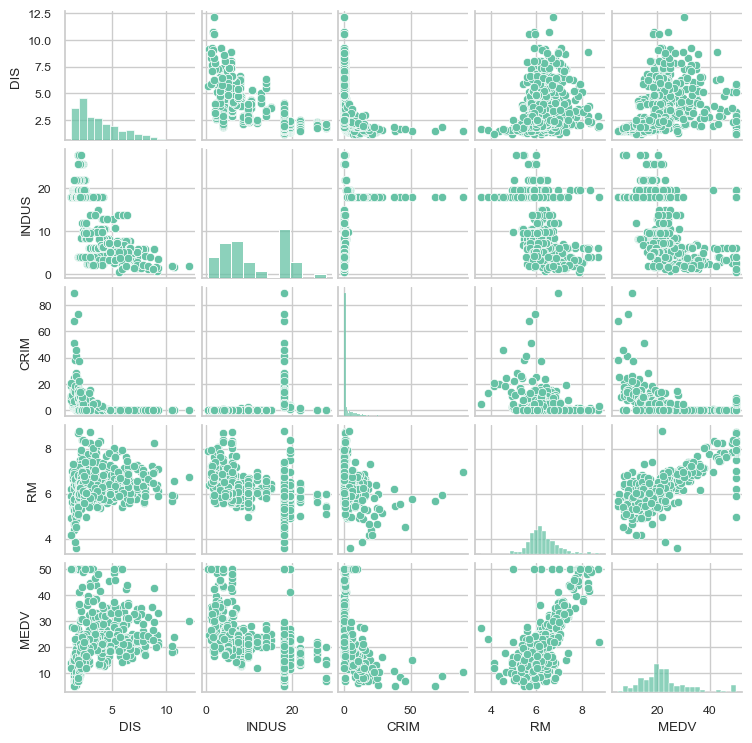

In [3]:
# Columnas seleccionadas
cols = ['DIS', 'INDUS', 'CRIM', 'RM', 'MEDV']
sns.pairplot(data=df[cols], height=1.5)
plt.show()

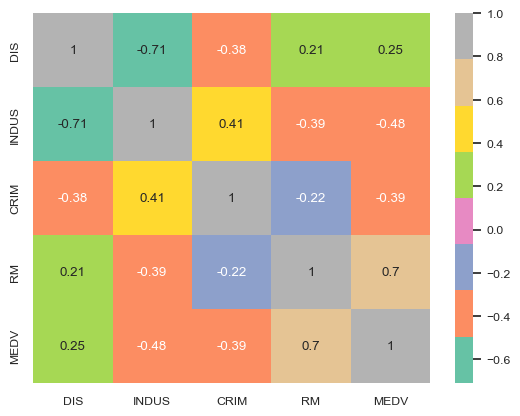

In [4]:
cm = np.corrcoef(df[cols].values.T)
sns.heatmap(cm, cbar=True, annot=True, yticklabels=cols, xticklabels=cols, cmap='Set2')
plt.show()

In [5]:
corr_matrix = df[cols].corr()
corr_matrix

,DIS,INDUS,CRIM,RM,MEDV
DIS,1.000000,-0.708027,-0.379670,0.205246,0.249929
INDUS,-0.708027,1.000000,0.406583,-0.391676,-0.483725
CRIM,-0.379670,0.406583,1.000000,-0.219247,-0.388305
RM,0.205246,-0.391676,-0.219247,1.000000,0.695360
MEDV,0.249929,-0.483725,-0.388305,0.695360,1.000000


In [6]:
corr_medv = corr_matrix['MEDV'].sort_values(ascending=False)
print(corr_medv)

MEDV     1.000000
RM       0.695360
DIS      0.249929
CRIM    -0.388305
INDUS   -0.483725
Name: MEDV, dtype: float64


In [7]:
X = df[['RM', 'INDUS']].values
y = df['MEDV'].values.reshape(-1,1)

sc_x = StandardScaler()
sc_y = StandardScaler()

X_std = sc_x.fit_transform(X)
y_std = sc_y.fit_transform(y)

slr = LinearRegression()
slr.fit(X_std, y_std)

LinearRegression()

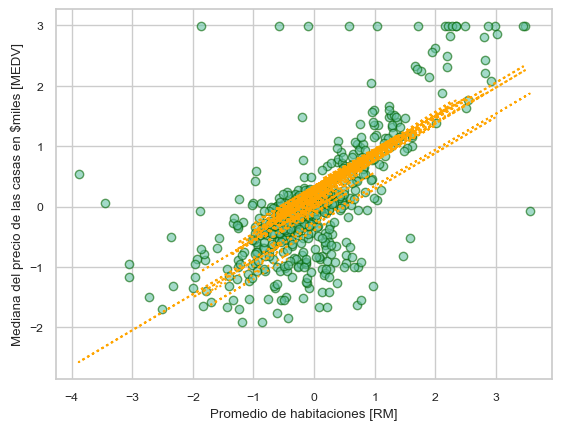

In [8]:
plt.scatter(X_std[:, 0], y_std, alpha=0.6, edgecolors='darkgreen')
plt.plot(X_std[:, 0], slr.predict(X_std), color='orange', linestyle=':')
plt.ylabel('Mediana del precio de las casas en $miles [MEDV]')
plt.xlabel('Promedio de habitaciones [RM]')
plt.show()

/Users/laasanchezgi/Documents/data-science/platzi/regresion-lineal-con-python-y-scikitlearn/.env/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  warnings.warn(
/var/folders/xp/t6sq60kn6xb52fxndvyg162h0000gn/T/ipykernel_7483/2866050507.py:11: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


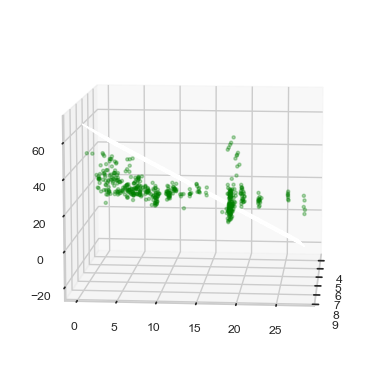

In [9]:
x1_range = np.arange(df['RM'].min(), df['RM'].max())
x2_range = np.arange(df['INDUS'].min(), df['INDUS'].max())

X1, X2 = np.meshgrid(x1_range, x2_range)

plane = pd.DataFrame({'RM': X1.ravel(), 'INDUS': X2.ravel()})
pred = slr.predict(plane).reshape(X1.shape)
pred = sc_y.inverse_transform(pred)

fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(X1, X2, pred, alpha=0.4, color='orange')

ax.scatter3D(df['RM'], df['INDUS'], df['MEDV'], color='green', marker='.', alpha=0.3)
ax.view_init(elev=10, azim=5)
plt.show()

In [10]:
# Normalizar el número de habitaciones ('num_hab')
num_hab = 5
num_hab_std = sc_x.transform(np.array([[num_hab, 0]]))

# Predecir con el modelo de regresión lineal
prediction_std = slr.predict(num_hab_std)

# Desnormalizar la predicción
prediction = sc_y.inverse_transform(prediction_std)

# Imprimir la predicción
print(f'El precio de una casa con 5 habitaciones en Boston es de {sc_y.inverse_transform(slr.predict(num_hab_std))} mil dolares')

El precio de una casa con 5 habitaciones en Boston es de [[16.21195983]] mil dolares


In [11]:
#LIBs
import plotly.express as px
import plotly.graph_objects as go

# TRAINING MODEL
X = df[['RM', 'INDUS']].values
y = df['MEDV'].values.reshape(-1, 1)


slr = LinearRegression()
slr.fit(X, y)

# PLOTTING
mesh_size = .02
margin = 0

# Create a mesh grid on which we will run our model
x_min, x_max = X[:,0].min() - margin, X[:,0].max() + margin
y_min, y_max = X[:,1].min() - margin, X[:,1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = slr.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='RM', y='INDUS', z='MEDV')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface'))
fig.show()